# Preprocessing: Pipeline Setup
* Grayscale morphology: markers and masks
* Grayscale morphology: H-domes

In [2]:
using Pkg
Pkg.activate("../notebooks/calval/")
Pkg.add(;name="IceFloeTracker", rev="main") # potentially lets me use the dev version!
using Images
using IceFloeTracker
using CSV
Pkg.add("CairoMakie")
using CairoMakie
using DataFrames
using Peaks

  Activating project at `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval`
    Updating git-repo `https://github.com/WilhelmusLab/IceFloeTracker.jl.git`
   Resolving package versions...
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`
   Resolving package versions...
   Installed Rmath ────────────── v0.8.1
   Installed ColorBrewer ──────── v0.4.2
   Installed StructArrays ─────── v0.7.2
   Installed IntervalArithmetic ─ v1.0.1
    Updating `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  [13f3f980] + CairoMakie v0.15.6
    Updating `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`
  [1520ce14] + AbstractTrees v0.4.5
  [35492f91] + AdaptivePredicates v1.2.0


In [3]:
Pkg.resolve()

  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`


In [9]:
include("../scripts/dev/filter_tiles.jl")
# include("../scripts/dev/nonlinear_diffusion.jl")
# include("../scripts/dev/validation_data.jl")
# include("../scripts/dev/gradient_functions.jl")

filter_function (generic function with 1 method)

In [10]:
df = DataFrame(CSV.File("../data/validation_dataset_testtrain_split.csv"));
df_training = copy(df[df.training,:]);

clear_sky_training_cases = df_training[df_training.cloud_fraction_manual .< 0.25  .&& (df_training.visible_sea_ice .== "yes"), [:case_number, :satellite]];

# Parameters and cloud mask

In [16]:
using IceFloeTracker: AbstractCloudMaskAlgorithm, PeronaMalikDiffusion
using IceFloeTracker: fill_holes

In [17]:
data_loader = Watkins2025GitHub(; ref="b865acc62f223d6ff14a073a297d682c4c034e5d")
dataset = data_loader(c -> c.case_number == 63 && c.satellite == "terra");
case = first(dataset);


In [32]:
cloud_mask_settings = (
    prelim_threshold=53.0/255.,
    band_7_threshold=130.0/255.,
    band_2_threshold=169.0/255.,
    ratio_lower=0.0,
    ratio_offset=0.0,
    ratio_upper=0.53
)

cmask = LopezAcostaCloudMask(cloud_mask_settings...)
tile_size_pixels = 100


@kwdef struct Watkins2025CloudMask <: AbstractCloudMaskAlgorithm
    prelim_threshold::Float64 = 0.21
    band_7_threshold::Float64 = 0.51
    band_2_threshold::Float64 = 0.66
    ratio_lower::Float64 = 0.0
    ratio_offset::Float64 = 0.0
    ratio_upper::Float64 = 0.53
    marker_strel = strel_box((7,7))
    opening_strel = strel_diamond((3,3))
end


# use functor notation to define a function using the parameter struct
function (f::Watkins2025CloudMask)(img::AbstractArray{<:Union{AbstractRGB,TransparentRGB}})
    init_cloud_mask = LopezAcostaCloudMask(f.prelim_threshold,
                                           f.band_7_threshold,
                                           f.band_2_threshold,
                                           f.ratio_lower,
                                           f.ratio_offset,
                                           f.ratio_upper)(img)
    markers = opening(init_cloud_mask, f.marker_strel)
    reconstructed = mreconstruct(dilate, markers, init_cloud_mask, f.opening_strel)
    smoothed = opening(reconstructed, f.opening_strel)
    filled = fill_holes(smoothed)
    return filled
end

# # Updated unsharp mask
# function unsharp_mask(
#     img::AbstractArray{<:Union{AbstractRGB,TransparentRGB,AbstractGray}},
#     radius::Real=2,
#     amount::Real=0.4,
#     threshold::Real=0.01)

#     image_float = float64.(img)
#     image_smoothed = imfilter(image_float, Kernel.gaussian(radius))

#     cv_image = channelview(image_float)
#     cv_smooth = channelview(image_smoothed)    
#     diff = cv_image .- cv_smooth
#     cv_sharp = cv_image .+ diff .* amount
#     clamp!(cv_sharp, 0, 1)

#     # # Convert back into an image of the original type
#     sharpened_image = colorview(base_colorant_type(eltype(img)), cv_sharp)
#     sharpened_image = convert.(eltype(img), sharpened_image)

#     # Optionally use only where sharpening is larger than threshold
#     diff_magnitude = length(size(diff)) > 2 ? dropdims(sqrt.(sum(diff.^2, dims=1)); dims=1) : abs.(diff)

#     threshold > 0 && (sharpened_image[diff_magnitude .< threshold] .= img[diff_magnitude .< threshold])
    
#     return sharpened_image
# end

In [31]:
t = tiles[1]
filter_function(tc_img[t...], fc_img[t...], cloud_mask[t...], land_mask.dilated[t...])

false

In [34]:
new_cmask = Watkins2025CloudMask();
pmd_diff = PeronaMalikDiffusion(0.1, 0.1, 5, "exponential")

tc_img = RGB.(case.modis_truecolor)
fc_img = RGB.(case.modis_falsecolor)

land_mask = IceFloeTracker.create_landmask(case.modis_landmask)
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, Watkins2025CloudMask())

# temp: reverse landmask
# land_mask = (non_dilated = .!land_mask.non_dilated, dilated = .!land_mask.dilated)
tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels) # Tile size of 200 --> 50 km

# Get list of tiles to process
filtered_tiles = filter(
    t -> filter_function(tc_img[t...], fc_img[t...], cloud_mask[t...], land_mask.dilated[t...]), tiles)

# If desired, a mask can be made for the tiles included after filtering
tile_markers = zeros(size(cloud_mask))
for tile in filtered_tiles
    tile_markers[tile...] .= 1
end

@info "Diffuse and sharpen the full image"
# Image diffusion can be slow, so applying it only to the tiles in the filtered list
# speeds things up linearly (i.e. half the number of tiles takes half as long.)
# This does slightly change the result, as borders of tiles are not diffused.
tc_diffused_sharpened = deepcopy(tc_img)
@time begin
    for tile in filtered_tiles
        tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> IceFloeTracker.unsharp_mask
    end
end

@info "Histogram adjustment"
# Things to prevent issues: the rblocks and cblocks not result in cutting the image into too small of pieces.
# 50 km - 100 km block seems okay. Done on the whole image as the algorithm is rather fast.
rblocks, cblocks = round.(Int64, size(tc_img) ./ tile_size_pixels)
rblocks = maximum((1, rblocks))
cblocks = maximum((1, cblocks))

@time adjust_histogram!(tc_diffused_sharpened, AdaptiveEqualization(clip=0.99, rblocks=2, cblocks=2, nbins=128))

tc_gray = Gray.(tc_diffused_sharpened)
# Increase the range from dark to bright
adjust_histogram!(tc_gray, ContrastStretching(slope=3.5))

test = adjust_histogram(tc_gray, LinearStretching())

# Stretch from 0 to 1
# test = adjust_histogram(test, LinearStretching())
# # Adjust the histogram
# tc_diffused_sharpened .= tc_diffused_sharpened .* .! cloud_mask .* tile_markers

[ Info: Diffuse and sharpen the full image


LoadError: UndefVarError: `nonlinear_diffusion` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [15]:
# Grayscale morphological operations
dilated_img = dilate(tc_gray, strel_diamond((3, 3)))
equalized_gray_sharpened_reconstructed = clamp.(mreconstruct(
    dilate, complement.(dilated_img), complement.(tc_gray), strel_diamond((3, 3))), 0, 1);


LoadError: UndefVarError: `tc_gray` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

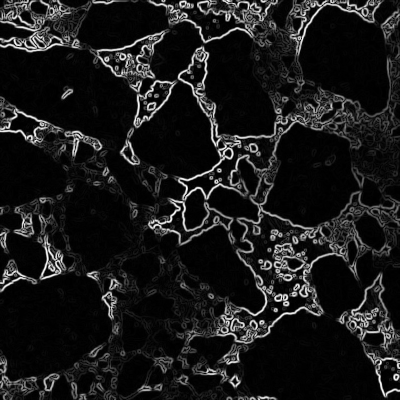

In [245]:
Gx, Gy = imgradients(equalized_gray_sharpened_reconstructed,  KernelFactors.sobel, "replicate")
gmag = hypot.(Gx, Gy)
for tile in tiles
    gmag[tile...] .= gmag[tile...] ./ maximum(gmag[tile...]) # local max, smoothed?
end
Gray.(gmag)

In [177]:
local_max = ImageMorphology.local_minima(equalized_gray_sharpened_reconstructed; connectivity=1) .> 0;

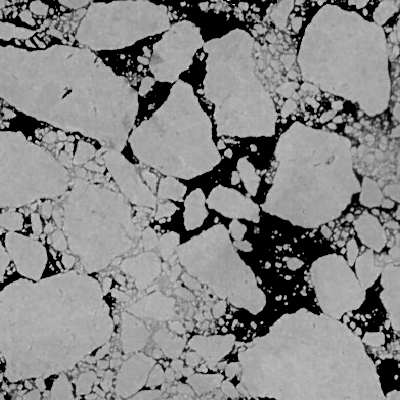

In [178]:
morphed_residue = dilate(Gray.(tc_img), strel_diamond((3,3))) .- equalized_gray_sharpened_reconstructed

In [190]:
using Random

segments = zeros(Int64, size(tc_img))
k = 5
for tile in tiles
    segments[tile...] = IceFloeTracker.kmeans_segmentation(float64.(tc_gray[tile...]), k=k)
end
# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end
# add the tiled adaptive binarization
function tiled_adaptive_binarization(img, tiles; minimum_window_size=50, minimum_brightness=75/255, threshold_percentage=15)
    canvas = zeros(size(img))
    img = deepcopy(img)
    img[Gray.(img) .< minimum_brightness] .= 0
    for tile in tiles
        L = Int64.(round.(minimum(length.(tile)) / 8, digits=0))
        L < minimum_window_size && (L = minimum_window_size)

        f = AdaptiveThreshold(img[tile...], window_size = L, percentage = threshold_percentage)
        canvas[tile...] = binarize(img[tile...], f)
    end
    
    # possibly overkill
    canvas[Gray.(img) .< minimum_brightness] .= 0 
    return canvas
end




tiled_adaptive_binarization (generic function with 1 method)

In [191]:
include("../scripts/dev/segmentation.jl")

stitch_clusters (generic function with 3 methods)

In [192]:
bin_img = tiled_adaptive_binarization(tc_gray, tiles;
    minimum_window_size=400, minimum_brightness=0.3 , threshold_percentage=0);
tc_seg = SegmentedImage(tc_img, label_components(segments))
tc_seg_stitched = SegmentedImage(tc_img, label_components(stitch_clusters(tiles, tc_seg)))
bdry_seg = SegmentedImage(gmag, tc_seg_stitched.image_indexmap)
local_max_seg = SegmentedImage(bin_img, tc_seg_stitched.image_indexmap)
gray_seg = SegmentedImage(tc_gray, tc_seg_stitched.image_indexmap)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 10358

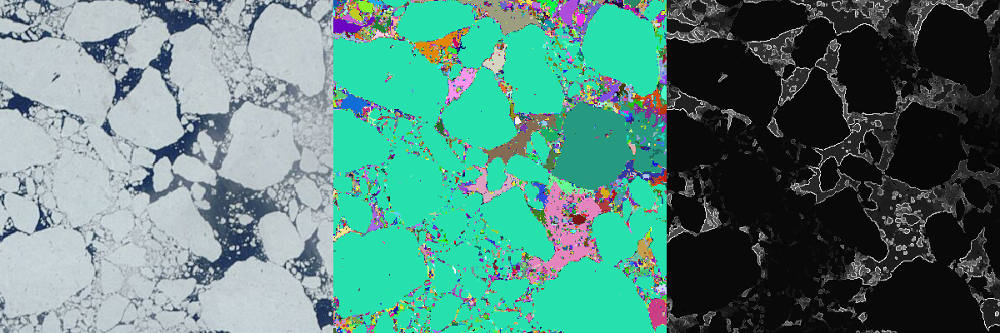

In [193]:
mosaicview(tc_img, view_seg_random(tc_seg_stitched), view_seg(bdry_seg), nrow=1)

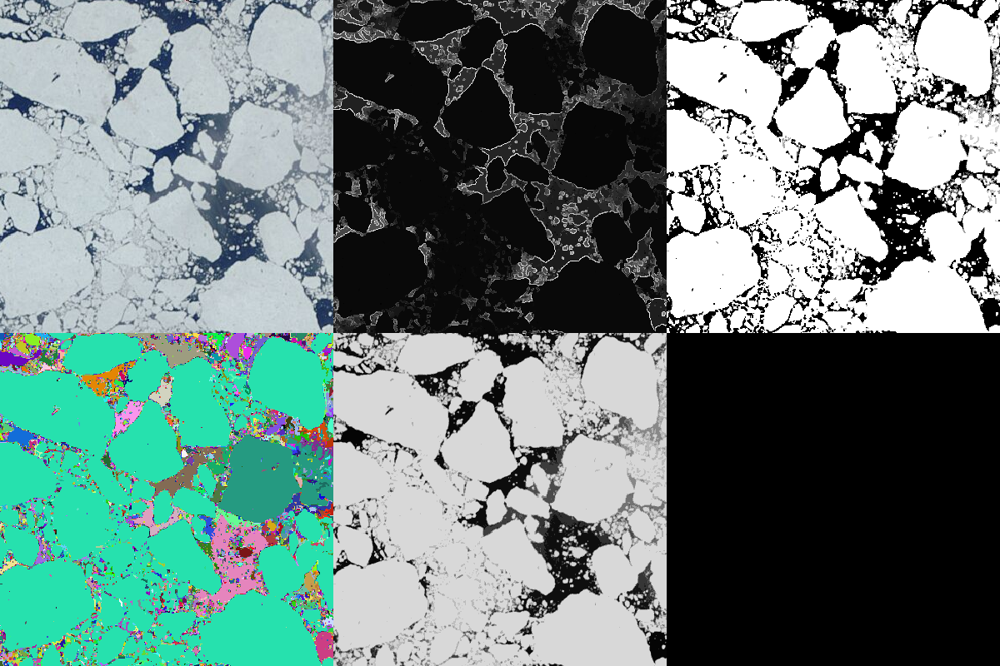

In [211]:
# Categories: 
# Water (tc_img mean red channel l

rem_labels = [s for s in bdry_seg.segment_labels if (bdry_seg.segment_means[s] > 0.1 && bdry_seg.segment_pixel_count[s] < 10)];

In [227]:
keep_labels = [s for s in segment_labels(gray_seg) if segment_mean(gray_seg, s) > 0.5 && segment_pixel_count(gray_seg, s) > 10];

In [228]:
length(rem_labels)
diff_fn(rlab, nlab) = segment_mean(bdry_seg, nlab) - segment_mean(bdry_seg, rlab);
new_seg = prune_segments(bdry_seg, rem_labels, diff_fn);

In [8]:
print("Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.")
mosaicview(tc_img, view_seg_random(tc_seg_stitched), view_seg(bdry_seg),
            view_seg(gray_seg), view_seg(local_max_seg), view_seg_random(new_seg), nrow=2)

Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.

LoadError: UndefVarError: `view_seg_random` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

If we consider the distance to objects of a different type, we can use that information to distinguish between shadows and melt points within large floes vs the bits of noisy boundary fragments in the interstitial ice. 

In [230]:
new_map = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    idx = gray_seg.image_indexmap .== ii
    new_map[idx] .= ii
end

In [231]:
test_seg = SegmentedImage(tc_gray, new_map)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 386

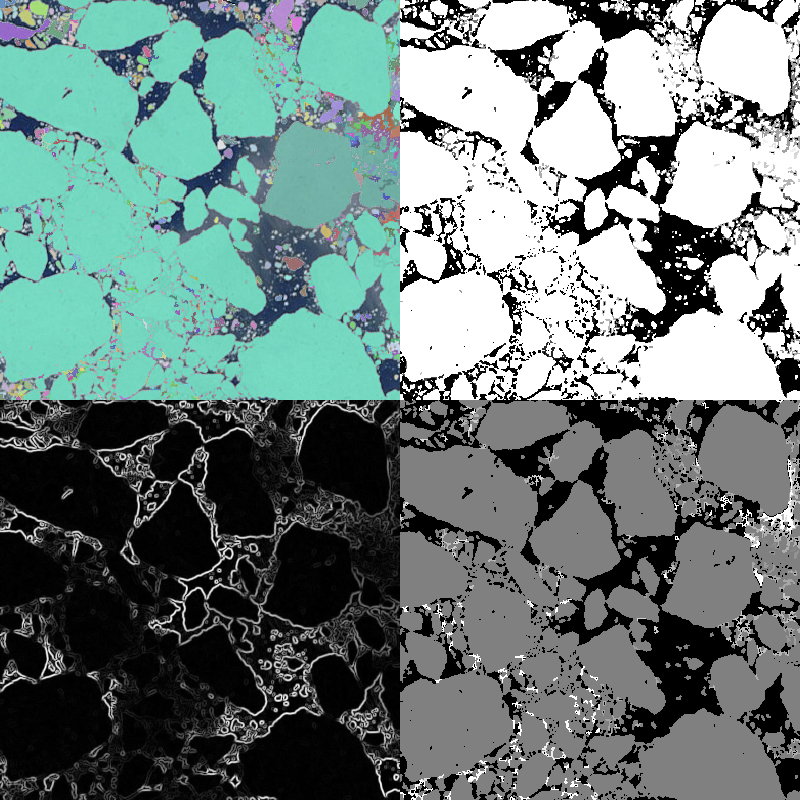

In [232]:
tc_img_cp = deepcopy(tc_img)
test_overlay = view_seg_random(test_seg) .* (new_map .!= 0)
tc_img_cp[new_map .!= 0] .= 0.5 .* test_overlay[new_map .!= 0] .+ 0.5 .* tc_img_cp[new_map .!= 0]
mosaicview(tc_img_cp, gmag, view_seg(local_max_seg), Gray.(test_seg.image_indexmap .> 0) .- 0.5 .* view_seg(local_max_seg),  nrow=2)

So - does the segmentation help us more than the binarization does? What can I do with the edge gradient information? Tag and watershed? Use Ellen's / Alexis' method?

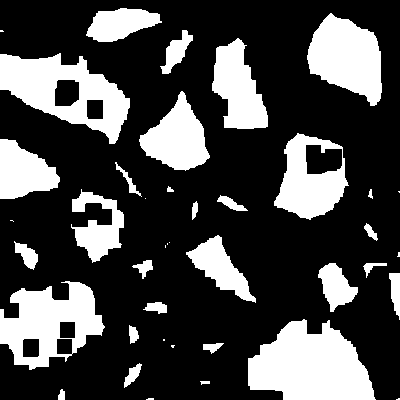

In [244]:
Gray.(IceFloeTracker.erode(view_seg(local_max_seg) .> 0.9, strel_box((15,15))))

In [120]:
length(segment_labels(new_seg))

2452

In [121]:
rem_labels = [s for s in segment_labels(new_seg) if segment_pixel_count(new_seg, s) < 64]
diff_fn(rlab, nlab) = segment_mean(gray_seg, nlab) - segment_mean(gray_seg, rlab)
new_seg2 = prune_segments(bdry_seg, rem_labels, diff_fn);

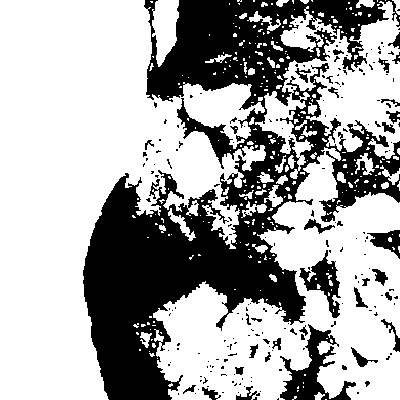

In [122]:
Gray.(view_seg(gray_seg) .> 0.5)

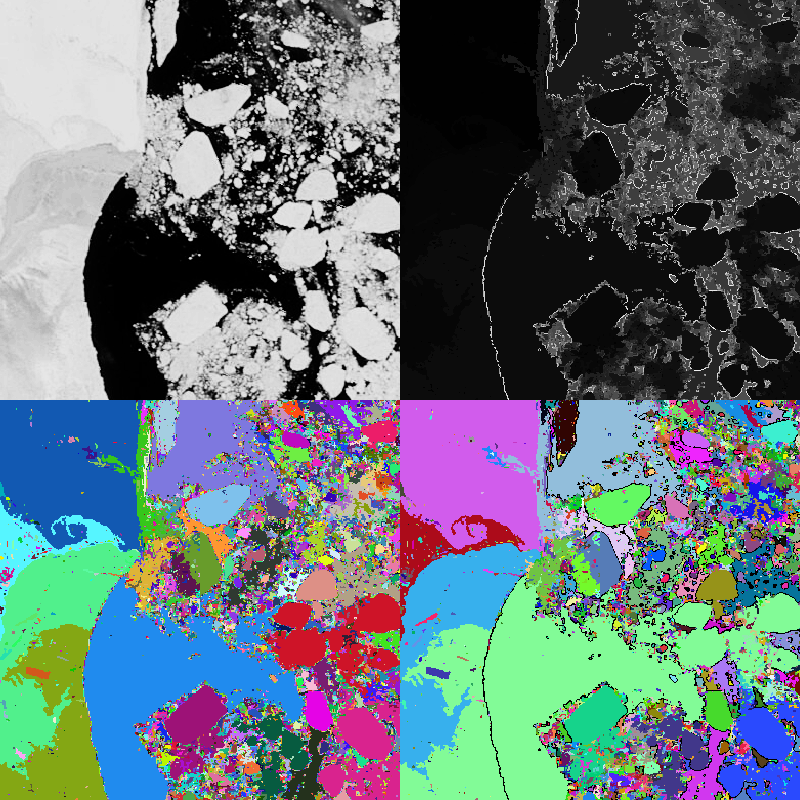

In [130]:
mosaicview(tc_gray,
    view_seg_random(tc_seg_stitched), view_seg(new_seg2), view_seg_random(new_seg2) .* (view_seg(bdry_seg) .< 0.5), nrow=2)

[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] (cache misses: wrong dep version loaded (4), incompatible header (8), mismatched flags (2))
[ Info: Precompiling FileIOExt [f5f51d8f-5827-5d2e-939b-192fcd6ec70c] (cache misses: wrong dep version loaded (4), incompatible header (8), mismatched flags (2))
[ Info: Precompiling UnitfulExt [0e51ec96-f580-5f12-a625-1297083d7970] (cache misses: wrong dep version loaded (2), incompatible header (8))
[ Info: Precompiling GeometryBasicsExt [b238bd29-021f-5edc-8b0e-16b9cda5f63a] (cache misses: wrong dep version loaded (2), incompatible header (8))
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a] (cache misses: wrong dep version loaded (2), incompatible header (6))


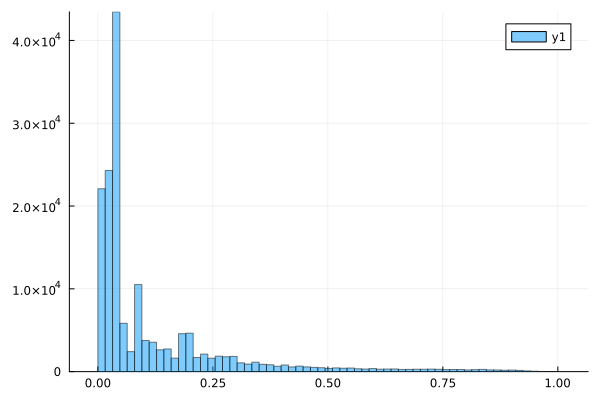

In [84]:
using Plots
histogram(vec(Float64.(Gray.(view_seg(bdry_seg)))), bins=range(0, 256, 64) ./ 255, alpha=0.5)

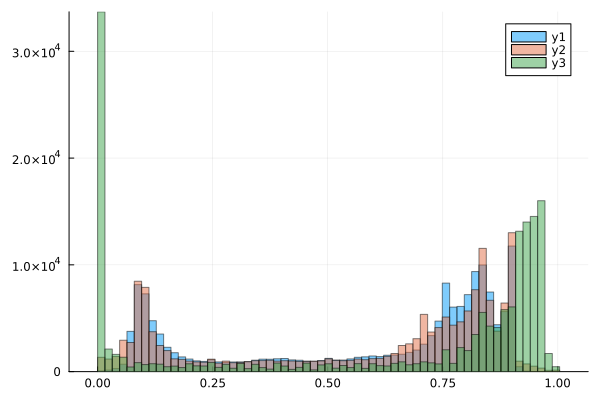

In [342]:
histogram(vec(Float64.(Gray.(tc_img))), bins=range(0, 256, 64) ./ 255, alpha=0.5)
histogram!(vec(Float64.(Gray.(tc_diffused_sharpened))), bins=range(0, 256, 64) ./ 255, alpha=0.5)
histogram!(vec(Float64.(Gray.(test))), bins=range(0, 256, 64) ./ 255, alpha=0.5)

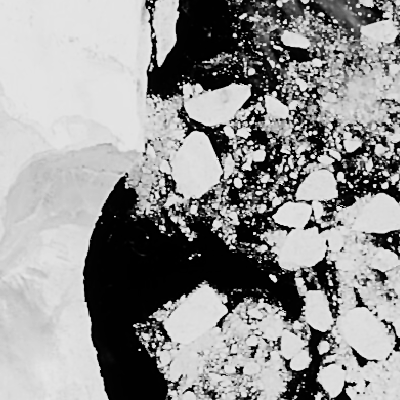

In [261]:
adjust_histogram(Gray.(tc_diffused_sharpened), ContrastStretching(slope=3.5))

In [217]:
tc_img = load("../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_truecolor.2020162.aqua.250m.tiff")
fc_img = load("../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_falsecolor.2020162.aqua.250m.tiff")
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)
land_mask = IceFloeTracker.create_landmask(load("../../IceFloeTracker.jl/test/test_inputs/landmask.tiff"), strel_diamond((11,11)))
cloud_mask = cloud_mask .* land_mask.non_dilated;

In [218]:
tiles = IceFloeTracker.get_tiles(tc_img, 200)
tile_markers = zeros(size(cloud_mask))
filtered_tiles = filter(t -> filter_function(tc_img[t...], fc_img[t...], cloud_mask[t...], .!land_mask.dilated[t...]), tiles)
for tile in filtered_tiles
    tile_markers[tile...] .= 1
end

In [220]:
@time tc_diffused_sharpened_init = nonlinear_diffusion(deepcopy(tc_img), pmd_diff) |> unsharp_mask;

  0.078059 seconds (1.98 k allocations: 417.855 MiB, 5.08% gc time)


In [221]:
@time begin
    tc_diffused_sharpened2 = deepcopy(tc_img)
    for tile in filtered_tiles
        tc_diffused_sharpened2[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> unsharp_mask
    end
end

  0.093519 seconds (7.61 k allocations: 422.995 MiB, 7.15% gc time)


In [222]:
@time begin
    tc_diffused_sharpened = deepcopy(tc_img)
    for tile in tiles
        tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> unsharp_mask
    end
end
nothing

  0.093710 seconds (7.61 k allocations: 422.995 MiB, 8.14% gc time)


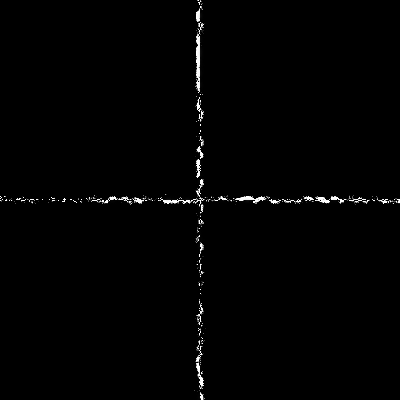

In [223]:
Gray.(abs.(tc_diffused_sharpened_init .- tc_diffused_sharpened))

In [224]:
maximum(abs.(Float64.(Gray.(tc_diffused_sharpened_init)) .- Float64.(Gray.(tc_diffused_sharpened))))

0.0784313725490196

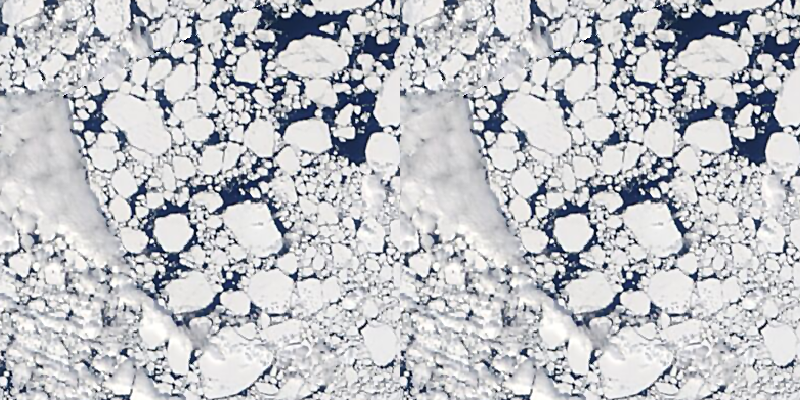

In [227]:
mosaicview(tc_diffused_sharpened_init, tc_diffused_sharpened, nrow=1)

In [196]:
length(tiles), length(filtered_tiles)

(902, 472)

  1.763934 seconds (2.23 M allocations: 1.356 GiB, 15.36% gc time, 16.94% compilation time)


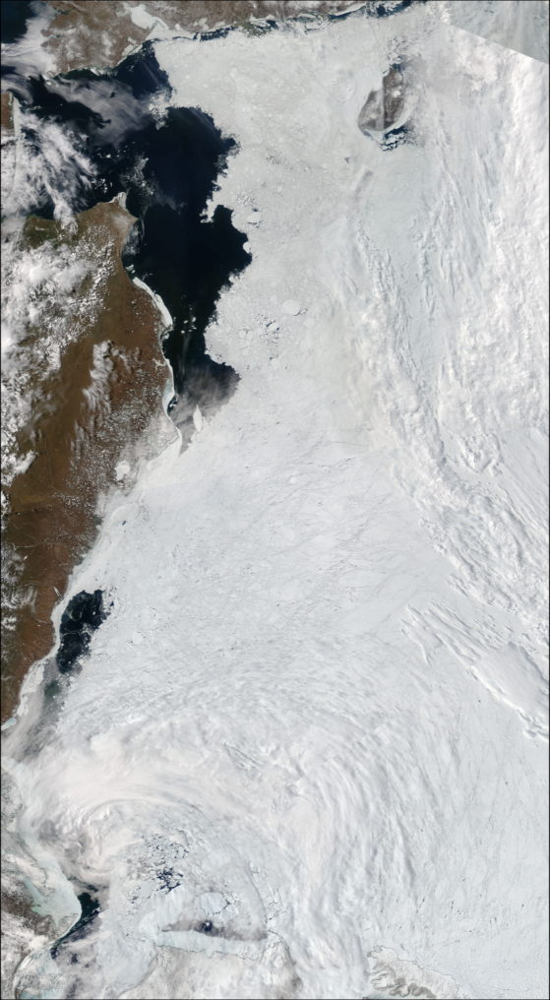

In [197]:
@time adjust_histogram(tc_diffused_sharpened, f)

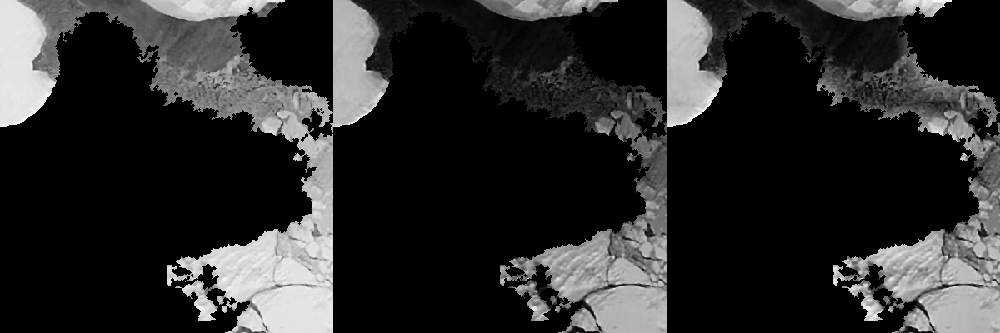

In [180]:
f = AdaptiveEqualization(;nbins=256, rblocks=8, cblocks=8, clip=0.99)
gc = GammaCorrection(gamma=3)
mosaicview(Gray.(tc_diffused_sharpened), adjust_histogram(Gray.(tc_diffused_sharpened), gc), 
    adjust_histogram(adjust_histogram(Gray.(tc_diffused_sharpened), gc), f), nrow=1)

In [138]:
# Reconstruction
# markers = closing(binarize(Gray.(tc_diffused_sharpened), AdaptiveThreshold(window_size=200, percentage=0)))
# reconstructed = mreconstruct(dilate, complement.(markers), complement.(Gray.(tc_diffused_sharpened)))
# # reconstructed = adjust_histogram(reconstructed, G())
# Gray.(tc_diffused_sharpened) .- reconstructed

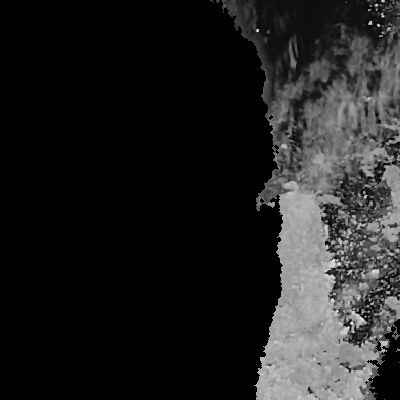

In [167]:
bin_img = opening(binarize(Gray.(tc_diffused_sharpened), AdaptiveThreshold(window_size=200, percentage=0)))
test = Gray.(tc_diffused_sharpened)
test[bin_img .== 0] .= 0.9 .* test[bin_img .== 0]
Gray.(test)

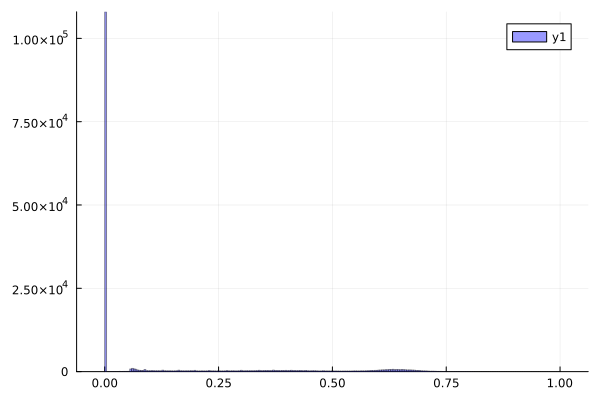

In [175]:
using Plots
bins = range(0, 1, 256)
histogram(vec(Float64.(test)), color=:blue, alpha=0.4, bins=bins)

# histogram!(vec(Float64.(adjust_histogram(Gray.(tc_diffused_sharpened), f))), color=:red, alpha=0.4, bins=bins)